In [1]:
include("../../juliasrc/calculate_potentials.jl");

 Activating environment at `/run/media/zhanibek/BE7C43F57C43A74D/PROJECTS/local-bpm-e34/Project.toml`


In [2]:
function mse(a::MinimizationTarget, b::MinimizationTarget)
    currents =  mean(@. (a.currents - b.currents)^2)
    return exp(1e5*(a.std_x - b.std_x)^2) - 1 + exp(1e5*(a.std_y - b.std_y)^2) -1 + currents
end


mse (generic function with 2 methods)

In [3]:
using Images
using ImageQualityIndexes

In [4]:
function get_ssim_error(x,y)
    a = fit(Histogram, (x[:,1], x[:,2]), (range(-beam_pipe_radius, stop=beam_pipe_radius, length=histogram_bins+1), range(-beam_pipe_radius, stop=beam_pipe_radius, length=histogram_bins+1)))
    b = fit(Histogram, (y[:,1], y[:,2]), (range(-beam_pipe_radius, stop=beam_pipe_radius, length=histogram_bins+1), range(-beam_pipe_radius, stop=beam_pipe_radius, length=histogram_bins+1)))
    # return mean((a.weights  - b.weights ).^2)
    assess_ssim(a.weights./maximum(a.weights), b.weights./maximum(b.weights))
end

get_ssim_error (generic function with 1 method)

In [5]:
function get_pixel_error(x, y)
    a = fit(Histogram, (x[:,1], x[:,2]), (range(-beam_pipe_radius, stop=beam_pipe_radius, length=histogram_bins+1), range(-beam_pipe_radius, stop=beam_pipe_radius, length=histogram_bins+1)))
    b = fit(Histogram, (y[:,1], y[:,2]), (range(-beam_pipe_radius, stop=beam_pipe_radius, length=histogram_bins+1), range(-beam_pipe_radius, stop=beam_pipe_radius, length=histogram_bins+1)))
    return mean((a.weights  - b.weights ).^2)
end

get_pixel_error (generic function with 1 method)

In [6]:
std_noise_levels = [0, 10, 20, 30];

In [7]:
using CSV, DataFrames, Glob

In [8]:
test_samples = [convert(Matrix,CSV.read(filename, header=false)) for filename in glob("2020.05.29 data/testsamples/*.csv")];

In [9]:
std_noised = [[convert(Matrix,CSV.read(filename, header=false)) for filename in glob("2020.05.29 data/std_noise/$i/*.csv")] for i in std_noise_levels];

In [10]:
std_noised_errors = [[get_ssim_error(std_noised[j][i], test_samples[i]) for i in eachindex(test_samples)] for j in eachindex(std_noised)];

# Noise on the <x^2> and <y^2>

In [11]:
using LaTeXStrings

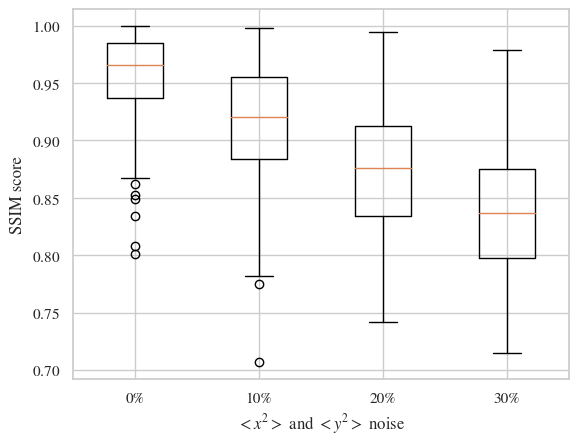

PyObject Text(26.015625, 0.5, 'SSIM score')

In [12]:
boxplot(std_noised_errors)
xticks([1, 2, 3, 4], ["0%", "10%", "20%", "30%"])
xlabel(L"$<x^2>$ and $<y^2>$ noise")
ylabel("SSIM score")
# savefig("2020.05.29 paper_plots/ssim_vs_noise500.png", dpi=500)

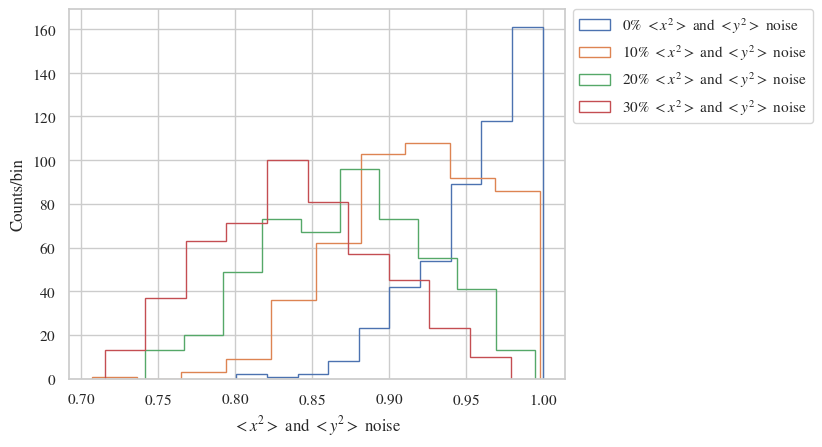

PyObject <matplotlib.legend.Legend object at 0x7f3989054d30>

In [13]:
hist(std_noised_errors[1], histtype="step", label=L"0% $<x^2>$ and $<y^2>$ noise")
hist(std_noised_errors[2], histtype="step", label=L"10% $<x^2>$ and $<y^2>$ noise")
hist(std_noised_errors[3], histtype="step", label=L"20% $<x^2>$ and $<y^2>$ noise")
hist(std_noised_errors[4], histtype="step", label=L"30% $<x^2>$ and $<y^2>$ noise")
# xticks([1, 2, 3, 4], ["0%", "10%", "20%", "30%"])
xlabel(L"$<x^2>$ and $<y^2>$ noise")
ylabel("Counts/bin")
legend(bbox_to_anchor=(1., 1.02))

In [14]:
plotting_indices = [4, 26, 24, 50, 20]

5-element Array{Int64,1}:
  4
 26
 24
 50
 20

In [23]:
pygui(false)

false

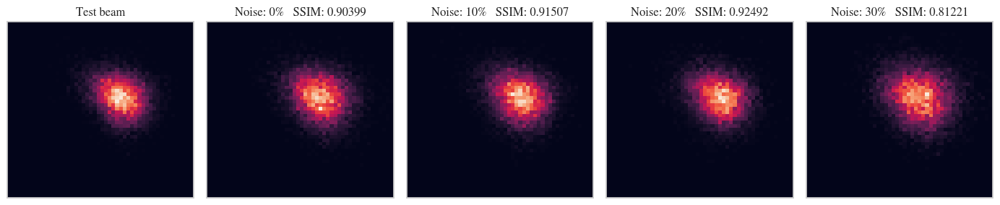

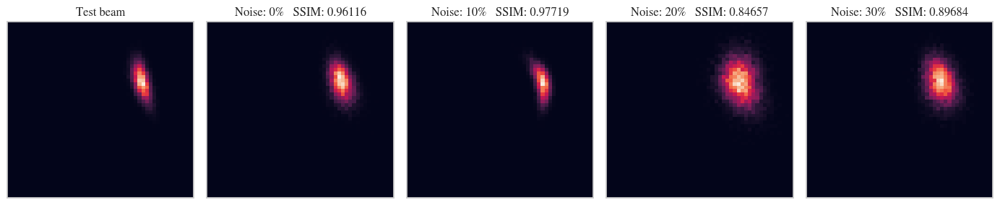

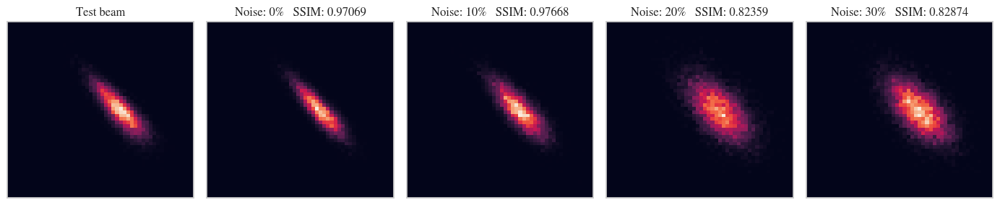

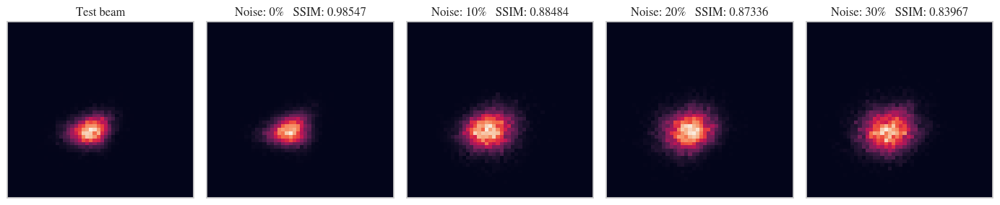

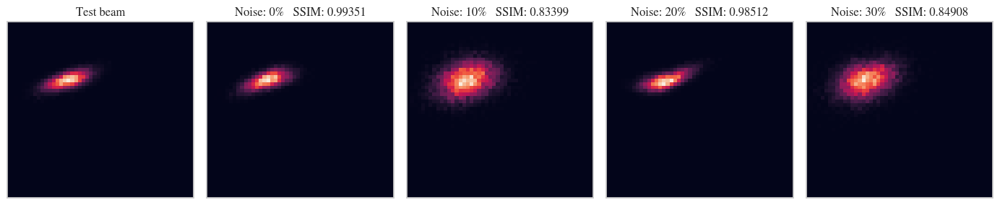

...

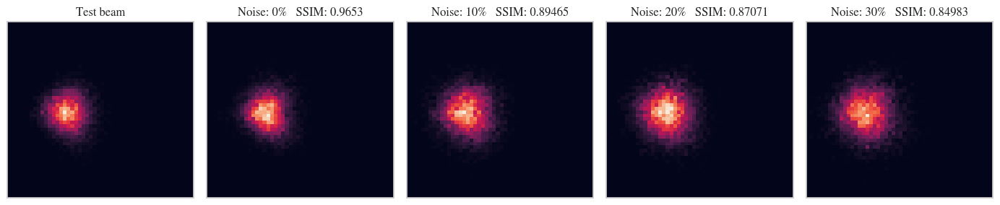

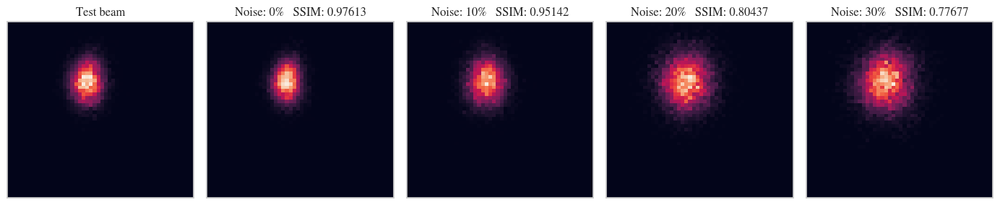

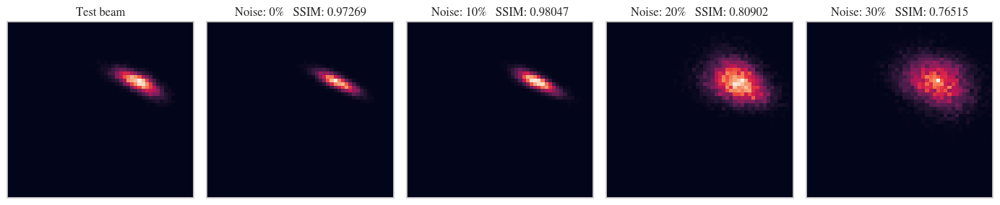

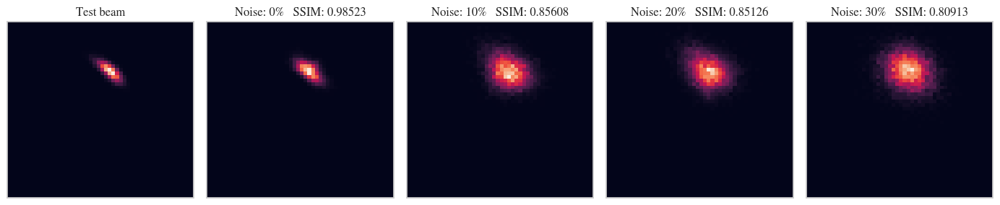

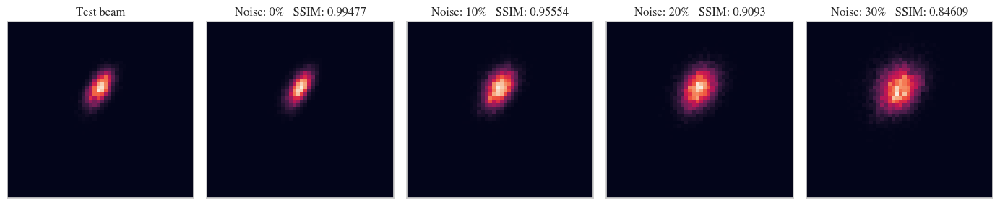

In [24]:
for i in eachindex(test_samples[1:500])

    noofplots = 5 
    
    fig, axes = plt.subplots(nrows=1, ncols=noofplots, sharey=true,figsize=(noofplots*2.8, 3))

    edges = range(-beam_pipe_radius, stop=beam_pipe_radius, length=histogram_bins+1)

    sca(axes[1])
    axes[1].xaxis.set_ticklabels([])
    axes[1].yaxis.set_ticklabels([])
    
    Z, xedges, yedges = hist2D(test_samples[i][:,2], test_samples[i][:,1], bins=[edges, edges])
    plt.pcolormesh(edges, edges, Z)
    # plt.colorbar()
    # xlabel("x [m]")
    # ylabel("y [m]")
    title("Test beam")
    for j in 2:noofplots
        sca(axes[j])
        axes[j].xaxis.set_ticklabels([])
        axes[j].yaxis.set_ticklabels([])

        y = std_noised[j-1][i]
        error = get_ssim_error(test_samples[i], y)

        Z, xedges, yedges = hist2D(y[:,2], y[:,1], bins=[edges, edges])
        plt.pcolormesh(edges, edges, Z)
        # plt.colorbar()
        title("Noise: $(std_noise_levels[j-1])%   SSIM: $(round(error, sigdigits=5))")
        # xlabel("x [m]")

    end
    tight_layout()
    savefig("2020.05.29 paper_plots_data_images/$(i).png", dpi=500)
    
end

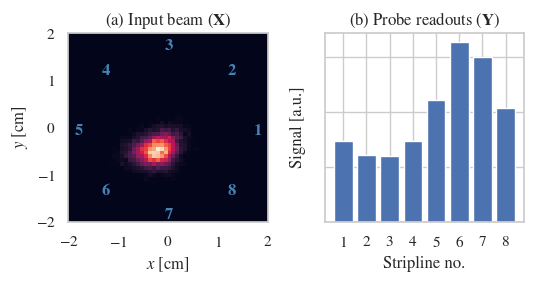

In [18]:
i = 4
x = 1e2 .* test_samples[i]

y = get_current_at_probes(x ./ 1e2)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(5.5,3))

edges = 1e2 .* range(-beam_pipe_radius, stop=beam_pipe_radius, length=histogram_bins+1)

sca(axes[1])
#axes[1].xaxis.set_ticklabels([])
#axes[1].yaxis.set_ticklabels([])

xlabel(raw"$x$ [cm]")
ylabel(raw"$y$ [cm]")


Z, xedges, yedges = hist2D(x[:,2], x[:,1], bins=[edges, edges])
plt.pcolormesh(edges, edges, Z)
radius = 2
offset = 0.2
for (i,angle) in enumerate(probe_angles)
    angle +=  0 * pi/2
    axes[1].annotate("$(i)",
                #xy=(radius*100*np.cos(angle), radius*100*np.sin(angle)),
                xy=(-0.07 + (radius-offset)*cos(angle), - 0.15 + (radius-offset)*sin(angle)),
                # ha="center",
                # va="center",
                color="steelblue",
                weight="bold") # , xycoords="axes fraction")

end
    # plt.colorbar()
    # xlabel("x [m]")
    # ylabel("y [m]")
# axes[1].tick_params(which="both", bottom=true, left=true, direction="out", length=6, width=1, grid_alpha=0.5)
# tick_params(which="both", bottom=True)
title(raw"(a) Input beam ($\mathbf{X}$)")

sca(axes[2])
# axes[2].xaxis.set_ticklabels([])
axes[2].yaxis.set_ticklabels([])
ylabel("Signal [a.u.]")


bar(collect(1:8), y)
axes[2].set_xticks(collect(1:8))
axes[2].set_xlabel("Stripline no.")
title(raw"(b) Probe readouts ($\mathbf{Y}$)")

tight_layout()

show()